# **Client behavior classification in Banking**


The purpose of this lab is to master classification clients in banking for machine learning models.

After completing this lab you will be able to:

1. preprocess (normilize and transform categorical data) and create dataset
2. features selection
3. make classification of clients
4. visualize decision tree of classification model  


## Outline


* Materials and Methods
* General Part
  * Import Libraries
  * Load the Dataset
  * Data preparation
      * Data transformation
      * Encoding and Normalization
  * Features selection
      * Chi-Squared Statistic
      * Mutual Information Statistic
      * Feature Importance
      * Correlation Matrix with Heatmap
  * Classification models
      * Train and Test DataSets creation
      * Extra Trees Classifier
      * Logistic regression 
  * Decision tree 
      * Build model
      * Visualization of decision tree
* Tasks
* Authors


----


## Materials and Methods


The data that we are going to use for this is a subset of an open source Bank Marketing Data Set from the UCI ML repository: https://archive.ics.uci.edu/ml/citation_policy.html.

> This dataset is public available for research. The details are described in [Moro et al., 2014].
Please include this citation if you plan to use this database:
[Moro et al., 2014] S. Moro, P. Cortez and P. Rita. A Data-Driven Approach to Predict the Success of Bank Telemarketing. Decision Support Systems, Elsevier, 62:22-31, June 2014

During the work, the task of a preliminary analysis of a positive response (term deposit) to direct calls from the bank is solved. In essence, the task is the matter of bank scoring, i.e. according to the characteristics of clients (potential clients), their behavior is predicted (loan default, a wish to open a deposit, etc.).

In this lesson, we will try to give answers to a set of questions that may be relevant when analyzing banking data:

1. What are the most useful Python libraries for classification analysis?
2. How to transform category data?
3. How to create DataSet?
4. How to do features selection?
5. How to make, fit and visualize classification model?

In addition, we will make the conclusions for the obtained results of our classification analysis to plan marketing banking campaigns more effectively.


[Scikit-learn](https://scikit-learn.org/stable/) (formerly scikits.learn and also known as sklearn) is a free software machine learning library for the Python programming language. It features various classification, regression and clustering algorithms including support vector machines, random forests, gradient boosting, k-means and DBSCAN, and is designed to interoperate with the Python numerical and scientific libraries NumPy and SciPy.


In [1]:
# !conda install anaconda::scikit-learn==1.3.0

## Import Libraries


Download data using a URL.


In [2]:
# ! wget https://archive.ics.uci.edu/ml/machine-learning-databases/00222/bank-additional.zip

Alternative URL for the dataset downloading.


In [3]:
# !wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/VDA_Banking_L2/bank-additional.zip

Unzipping to a folder. It is a good idea to apply the `-o` and `-q`  when unzipping to overwrite any existing folders and quiet the process.


In [4]:
# !unzip -o -q bank-additional.zip

If it doesn't work, try this.

In [5]:
# import urllib.request

# url = "https://archive.ics.uci.edu/ml/machine-learning-databases/00222/bank-additional.zip"
# urllib.request.urlretrieve(url, "bank-additional.zip")

Import the libraries necessary to use in this lab. We can add some aliases to make the libraries easier to use in our code and set a default figure size for further plots. Ignore the warnings.


In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
%matplotlib inline
plt.rcParams["figure.figsize"] = (8, 6)
# Data preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
# Features Selection
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, mutual_info_classif
# Classificators
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier 
from sklearn import tree
import graphviz
# warnings deactivate
import warnings
warnings.filterwarnings('ignore')

Further specify the value of the `precision` parameter equal to 2 to display two decimal signs (instead of 6 as default).


In [7]:
pd.set_option('display.precision', 2)
pd.options.display.float_format = '{:.2f}'.format

## Load the Dataset


In [8]:
df = pd.read_csv('bank-additional/bank-additional-full.csv', sep = ';')
df.head(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.10,93.99,-36.40,4.86,5191.00,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.10,93.99,-36.40,4.86,5191.00,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.10,93.99,-36.40,4.86,5191.00,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.10,93.99,-36.40,4.86,5191.00,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.10,93.99,-36.40,4.86,5191.00,no


In [9]:
df = pd.read_csv('bank-additional/bank-additional-full.csv', sep=';')
df.sample(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
14478,55,blue-collar,married,basic.4y,no,yes,no,cellular,jul,tue,...,2,999,0,nonexistent,1.40,93.92,-42.70,4.96,5228.10,no
5727,39,management,married,university.degree,no,yes,no,telephone,may,mon,...,3,999,0,nonexistent,1.10,93.99,-36.40,4.86,5191.00,no
23631,30,technician,single,professional.course,no,yes,no,cellular,aug,thu,...,12,999,0,nonexistent,1.40,93.44,-36.10,4.96,5228.10,no
28291,46,blue-collar,divorced,basic.6y,unknown,no,no,cellular,apr,wed,...,5,999,2,failure,-1.80,93.08,-47.10,1.45,5099.10,no
5147,51,admin.,divorced,unknown,no,unknown,unknown,telephone,may,fri,...,1,999,0,nonexistent,1.10,93.99,-36.40,4.86,5191.00,no


In [10]:
df.shape

(41188, 21)

In [11]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

As you can see DataSet consist 21 columns. Last column is the target. Also DataSet consist 41188 rows.


<details>
<summary><b>Click to see attribute information</b></summary>
Input features (column names):

1. `age` - client age in years (numeric)
2. `job` - type of job (categorical: `admin.`, `blue-collar`, `entrepreneur`, `housemaid`, `management`, `retired`, `self-employed`, `services`, `student`, `technician`, `unemployed`, `unknown`)
3. `marital` - marital status (categorical: `divorced`, `married`, `single`, `unknown`)
4. `education` - client education (categorical: `basic.4y`, `basic.6y`, `basic.9y`, `high.school`, `illiterate`, `professional.course`, `university.degree`, `unknown`)
5. `default` - has credit in default? (categorical: `no`, `yes`, `unknown`)
6. `housing` - has housing loan? (categorical: `no`, `yes`, `unknown`)
7. `loan` - has personal loan? (categorical: `no`, `yes`, `unknown`)
8. `contact` - contact communication type (categorical: `cellular`, `telephone`)
9. `month` - last contact month of the year (categorical: `jan`, `feb`, `mar`, ..., `nov`, `dec`) 
10. `day_of_week` - last contact day of the week (categorical: `mon`, `tue`, `wed`, `thu`, `fri`) 
11. `duration` - last contact duration, in seconds (numeric).
12. `campaign` - number of contacts performed for this client during this campaign (numeric, includes last contact) 
13. `pdays` - number of days that have passed after the client was last contacted from the previous campaign (numeric; 999 means the client has not been previously contacted) 
14. `previous` - number of contacts performed for this client before this campaign (numeric) 
15. `poutcome` - outcome of the previous marketing campaign (categorical: `failure`, `nonexistent`, `success`)
16. `emp.var.rate` - employment variation rate, quarterly indicator (numeric) 
17. `cons.price.idx` - consumer price index, monthly indicator (numeric) 
18. `cons.conf.idx` - consumer confidence index, monthly indicator (numeric) 
19. `euribor3m` - euribor 3 month rate, daily indicator (numeric) 
20. `nr.employed` - number of employees, quarterly indicator (numeric)

Output feature (desired target):

21. `y` - has the client subscribed a term deposit? (binary: `yes`,`no`)
</details>


Our goal is create the classification model that can predict  if the client will subscribe a term deposit or no? To do this we must analize and prepare data for such type of model.


## Data preparation


First of all we should investigate how pandas recognized types of features


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

As you can see all categorical features was recogized like object. We must change their type on "categorical". 


In [13]:
col_cat = list(df.select_dtypes(include='object').columns)
col_cat

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'day_of_week',
 'poutcome',
 'y']

Let's look at the dataset size.


In [14]:
df[col_cat] = df[col_cat].astype('category')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   age             41188 non-null  int64   
 1   job             41188 non-null  category
 2   marital         41188 non-null  category
 3   education       41188 non-null  category
 4   default         41188 non-null  category
 5   housing         41188 non-null  category
 6   loan            41188 non-null  category
 7   contact         41188 non-null  category
 8   month           41188 non-null  category
 9   day_of_week     41188 non-null  category
 10  duration        41188 non-null  int64   
 11  campaign        41188 non-null  int64   
 12  pdays           41188 non-null  int64   
 13  previous        41188 non-null  int64   
 14  poutcome        41188 non-null  category
 15  emp.var.rate    41188 non-null  float64 
 16  cons.price.idx  41188 non-null  float64 
 17  cons.conf.id

To see the unique values of an exact feature (column) we can use:


In [15]:
df['job'].unique()

['housemaid', 'services', 'admin.', 'blue-collar', 'technician', ..., 'unemployed', 'self-employed', 'unknown', 'entrepreneur', 'student']
Length: 12
Categories (12, object): ['admin.', 'blue-collar', 'entrepreneur', 'housemaid', ..., 'student', 'technician', 'unemployed', 'unknown']

As was signed earlier the dataset contains 41188 objects (rows), for each of which 20 features are set, with 1 target feature (y). 11 features, including the target are categorical. This datatype cannot use for classification. We must transform it to numeric (int or float). 
To do this we can use **[OrdinalEncoder](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OrdinalEncoder.html)**. These functions can encode categorical features as an integer array.

First of all, we separate dataset into input and output(target) datasets.


### Data transformation


In [16]:
X = df.iloc[:, :-1]    
y = df.iloc[:, -1]
X.sample(n=5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
8821,46,blue-collar,married,professional.course,no,no,no,telephone,jun,thu,1446,1,999,0,nonexistent,1.40,94.47,-41.80,4.87,5228.10
27806,29,self-employed,married,university.degree,no,no,no,cellular,mar,wed,101,1,999,0,nonexistent,-1.80,92.84,-50.00,1.66,5099.10
29868,41,admin.,married,professional.course,no,no,no,cellular,apr,mon,9,2,999,0,nonexistent,-1.80,93.08,-47.10,1.41,5099.10
28928,59,admin.,divorced,university.degree,no,yes,no,cellular,apr,fri,416,1,999,1,failure,-1.80,93.08,-47.10,1.41,5099.10
25051,58,retired,married,university.degree,no,yes,no,cellular,nov,tue,90,1,999,0,nonexistent,-0.10,93.20,-42.00,4.15,5195.80


### Train and Test Dataset Split

The first thing we should do before any data transformation is to set aside test dataset.

In [17]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((28831, 20), (12357, 20), (28831,), (12357,))

### Categorical Feature Encoding


Now create list of categorical fields and transform their values to int arrays: (Replace ##YOUR CODE GOES HERE## with your Python code.)


In [18]:
col_cat = list(X_train.select_dtypes(include='category').columns)
oe = OrdinalEncoder()
oe.fit(X_train[col_cat])
X_cat_enc = oe.transform(X_train[col_cat])
X_cat_enc

array([[4., 1., 6., ..., 6., 2., 1.],
       [4., 0., 6., ..., 8., 2., 1.],
       [1., 1., 2., ..., 6., 3., 1.],
       ...,
       [0., 2., 5., ..., 0., 2., 1.],
       [3., 2., 5., ..., 1., 1., 1.],
       [0., 1., 3., ..., 6., 4., 1.]])

In [19]:
oe.categories_

[array(['admin.', 'blue-collar', 'entrepreneur', 'housemaid', 'management',
        'retired', 'self-employed', 'services', 'student', 'technician',
        'unemployed', 'unknown'], dtype=object),
 array(['divorced', 'married', 'single', 'unknown'], dtype=object),
 array(['basic.4y', 'basic.6y', 'basic.9y', 'high.school', 'illiterate',
        'professional.course', 'university.degree', 'unknown'],
       dtype=object),
 array(['no', 'unknown', 'yes'], dtype=object),
 array(['no', 'unknown', 'yes'], dtype=object),
 array(['no', 'unknown', 'yes'], dtype=object),
 array(['cellular', 'telephone'], dtype=object),
 array(['apr', 'aug', 'dec', 'jul', 'jun', 'mar', 'may', 'nov', 'oct',
        'sep'], dtype=object),
 array(['fri', 'mon', 'thu', 'tue', 'wed'], dtype=object),
 array(['failure', 'nonexistent', 'success'], dtype=object)]

<details><summary>Click <b>here</b> for the solution</summary> 
<code>    
col_cat = ['job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'poutcome']
Or

col_cat = list(X.select_dtypes(include=['category']).columns)
    
    </code>
</details>


Then we must put transformed array back into X.


In [20]:
X_cat_enc = pd.DataFrame(X_cat_enc)
X_cat_enc.columns = col_cat
X_cat_enc

,job,marital,education,default,housing,loan,contact,month,day_of_week,poutcome
0,4.00,1.00,6.00,1.00,0.00,2.00,0.00,6.00,2.00,1.00
1,4.00,0.00,6.00,1.00,2.00,0.00,0.00,8.00,2.00,1.00
2,1.00,1.00,2.00,1.00,0.00,0.00,1.00,6.00,3.00,1.00
3,7.00,1.00,6.00,0.00,2.00,0.00,1.00,6.00,4.00,1.00
4,1.00,2.00,2.00,0.00,0.00,0.00,1.00,4.00,2.00,1.00
...,...,...,...,...,...,...,...,...,...,...
28826,0.00,0.00,6.00,0.00,0.00,0.00,0.00,1.00,4.00,1.00
28827,4.00,0.00,6.00,0.00,0.00,0.00,0.00,6.00,0.00,1.00
28828,0.00,2.00,5.00,0.00,0.00,0.00,0.00,0.00,2.00,1.00
28829,3.00,2.00,5.00,0.00,2.00,2.00,0.00,1.00,1.00,1.00


### Numerical Feature Nomalisation

Numerical fields can have different scale and can include negative values. These will lead to round mistakes and exeptions for some AI methods. To avoid it these features must be normalized.

Let's create list of numerical fields and normilize it using by **[MinMaxScaler](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MinMaxScaler.html)**.


In [21]:
col_num = list(X_train.select_dtypes('number').columns)

scaler = MinMaxScaler(feature_range=(0, 1))
X_num_enc = scaler.fit_transform(X_train[col_num])
X_num_enc

array([[0.24691358, 0.04643963, 0.        , ..., 0.19246862, 0.15710723,
        0.51228733],
       [0.45679012, 0.05096452, 0.        , ..., 1.        , 0.02720472,
        0.20378072],
       [0.39506173, 0.19361753, 0.01818182, ..., 0.60251046, 0.95715257,
        0.85973535],
       ...,
       [0.14814815, 0.10169088, 0.03636364, ..., 0.15481172, 0.16572206,
        0.51228733],
       [0.22222222, 0.02643487, 0.        , ..., 0.61506276, 0.98141011,
        1.        ],
       [0.43209877, 0.03143606, 0.        , ..., 0.60251046, 0.95783269,
        0.85973535]])

Like in previous case transform back obtained arrays into DataFrame.


In [22]:
X_num_enc = pd.DataFrame(X_num_enc, columns=col_num)
X_num_enc.head(5)

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,0.25,0.05,0.00,1.00,0.00,0.33,0.27,0.19,0.16,0.51
1,0.46,0.05,0.00,1.00,0.00,0.00,0.09,1.00,0.03,0.20
2,0.40,0.19,0.02,1.00,0.00,0.94,0.70,0.60,0.96,0.86
3,0.16,0.01,0.04,1.00,0.00,0.94,0.70,0.60,0.96,0.86
4,0.07,0.09,0.00,1.00,0.00,1.00,0.88,0.38,0.98,1.00


Then we should concatenate these DataFrames in one DataFrame for X.


In [23]:
X_enc = pd.concat([X_cat_enc, X_num_enc], axis=1)
X_enc.sample(n=5)

,job,marital,education,default,housing,loan,contact,month,day_of_week,poutcome,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
332,0.00,1.00,3.00,0.00,2.00,0.00,1.00,6.00,4.00,1.00,0.22,0.04,0.02,1.00,0.00,0.94,0.70,0.60,0.96,0.86
13331,7.00,0.00,3.00,0.00,1.00,1.00,1.00,6.00,3.00,1.00,0.37,0.07,0.04,1.00,0.00,0.94,0.70,0.60,0.96,0.86
22201,8.00,2.00,3.00,0.00,0.00,0.00,0.00,8.00,4.00,2.00,0.07,0.10,0.00,0.00,0.14,0.48,0.94,0.05,0.09,0.00
5328,1.00,2.00,2.00,0.00,0.00,0.00,0.00,3.00,1.00,1.00,0.22,0.01,0.04,1.00,0.00,1.00,0.67,0.34,0.98,1.00
24830,7.00,1.00,3.00,1.00,2.00,0.00,0.00,3.00,1.00,1.00,0.06,0.02,0.00,1.00,0.00,1.00,0.67,0.34,0.98,1.00


<details><summary>Click <b>here</b> for the solution</summary> 
<code>    
x_enc = pd.concat([X_cat_enc, X_num_enc], axis=1)
    </code>
</details>



### Target Encoding

We must do labelling for target field.


In [24]:
le = LabelEncoder()
y_enc = le.fit_transform(y_train)
le.classes_

array(['no', 'yes'], dtype=object)

In [25]:
y_train_enc = pd.Series(y_enc, name=y.name)
y_train_enc

0        0
1        0
2        0
3        0
4        0
        ..
28826    0
28827    0
28828    1
28829    0
28830    0
Name: y, Length: 28831, dtype: int32

In [26]:
y   # For comparison

0         no
1         no
2         no
3         no
4         no
        ... 
41183    yes
41184     no
41185     no
41186    yes
41187     no
Name: y, Length: 41188, dtype: category
Categories (2, object): ['no', 'yes']

As you can see values 'no' was changed to 0, 'yes' to 1.


## Features selection


As seen before, input fields consists 20 features. Of course, some of them are more significant for classification. 

There are two popular feature selection techniques that can be used for categorical input variables and a categorical target variable.

They are:

* Chi-Squared Statistic.
* Mutual Information Statistic.

Let’s take a closer look at each in turn.

To do this we can use **[SelectKBest](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.SelectKBest.html)**


### Chi-Squared Statistic


Pearson’s chi-squared statistical hypothesis test is an example of a test for independence between categorical variables.

You can learn more about this statistical test in the tutorial:

[A Gentle Introduction to the Chi-Squared Test for Machine Learning](https://machinelearningmastery.com/chi-squared-test-for-machine-learning/)
The results of this test can be used for feature selection, where those features that are independent of the target variable can be removed from the dataset.

The scikit-learn machine library provides an implementation of the chi-squared test:  **[chi2()](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.chi2.html#sklearn.feature_selection.chi2)**. This function can be used in a feature selection strategy, such as selecting the top k most relevant features (largest values) via the SelectKBest class.

For example, we can define the SelectKBest class using the chi2() and select all (or most significant) features, then transform the train and test sets.


Apply **SelectKBest** to extract top 5 best features among categorical features.


In [27]:
# Feture selection on train set
chi_fts = SelectKBest(score_func=chi2, k=5)
chi_fts.fit(X_enc[col_cat], y_enc)
chi_fts.scores_

array([ 75.46767889,  16.43817172, 118.68609781, 216.67913677,
         3.74813343,   1.9923961 , 383.73689271,   0.71521736,
         8.95165692,  67.85683809])

In [28]:
chi_scores = pd.DataFrame(chi_fts.scores_, index=col_cat, columns=['score'])
chi_scores    # Scores for entire columns

,score
job,75.47
marital,16.44
education,118.69
default,216.68
housing,3.75
loan,1.99
contact,383.74
month,0.72
day_of_week,8.95
poutcome,67.86


In [29]:
# Select best 5 features
chi_selected = X_enc[col_cat].columns[chi_fts.get_support()]   # Indexing doesn't work with col_cal (python list)
chi_selected

Index(['job', 'education', 'default', 'contact', 'poutcome'], dtype='object')

In [30]:
# Another way - the same result
chi_scores.nlargest(5, 'score').index

Index(['contact', 'default', 'education', 'job', 'poutcome'], dtype='object')

### Mutual Information Statistic


Mutual information from the field of information theory is the application of information gain (typically used in the construction of decision trees) to feature selection.

Mutual information is calculated between two variables and measures the reduction in uncertainty for one variable given a known value of the other variable.

[You can learn more about mutual information in the following tutorial.](https://machinelearningmastery.com/information-gain-and-mutual-information)

The scikit-learn machine learning library provides an implementation of mutual information for feature selection via the **[mutual_info_classif()](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.mutual_info_classif.html#sklearn.feature_selection.mutual_info_classif)** function.

Like chi2(), it can be used in the SelectKBest feature selection strategy (and other strategies). Mutual Information works with both categorical/continuous features.


In [31]:
mi_fts = SelectKBest(score_func=mutual_info_classif, k=10)
mi_fts.fit(X_enc, y_enc)
mi_fts.scores_

array([0.01032479, 0.00171104, 0.00337177, 0.004317  , 0.00318065,
       0.00018072, 0.01384845, 0.02784272, 0.0022926 , 0.03331093,
       0.01311143, 0.07176182, 0.00275133, 0.03710715, 0.01819456,
       0.05279298, 0.0691076 , 0.06706291, 0.07234277, 0.06294723])

In [32]:
mi_selected = X_enc.columns[mi_fts.get_support()]
mi_selected

Index(['month', 'poutcome', 'duration', 'pdays', 'previous', 'emp.var.rate',
       'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed'],
      dtype='object')

<details><summary>Click <b>here</b> for the solution</summary> 
<code>    
bestfeatures = SelectKBest(score_func=mutual_info_classif, k=10)
fit = bestfeatures.fit(x_enc,y_enc)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
featureScores = pd.concat([dfcolumns, dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features
    </code>
</details>




In [33]:
# Find what are commonly picked by two methods - only one!
set(mi_selected).intersection(set(chi_selected))

{'poutcome'}

As you can see two different selection method picked different significant features.


### Feature Importance


You can get the feature importance of each feature of your DataFrame by using the feature importance properties of the exact classification model.
Feature importance gives you a score for each feature of your data; the higher the score, the more important or relevant the feature towards your output variable.

Feature importance is an inbuilt class that comes with **[Tree Based Classifiers](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.ExtraTreesClassifier.html)**, we will be using Extra Tree Classifier for extracting the top 10 features for the dataset.


Let's create and fit the model.


In [34]:
clf = ExtraTreesClassifier()
clf.fit(X_enc, y_enc)

ExtraTreesClassifier()

Use inbuilt class feature_importances of tree based classifiers.


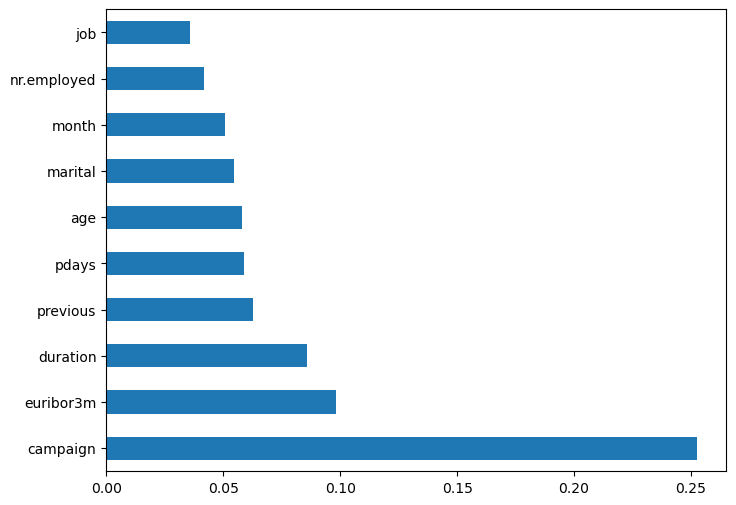

In [35]:
ft_import = pd.Series(clf.feature_importances_, index=X_train.columns)
fi_selected = ft_import.nlargest(10).index

ft_import.nlargest(10).plot(kind='barh')
plt.show()

Let's transform it into Series and plot graph of feature importances for better visualization.


In [36]:
# Find what features are commonly picked by chi-square
set(fi_selected) & set(chi_selected)

{'job'}

You can see that for Extra Tree Classifier impotance of features are different than in previous cases. It means that there are not exact rules for features selection. And their impotance strictly depedence on model.


### Correlation Matrix with Heatmap


Correlation states how the features are related to each other.
Correlation can be positive (increase in one value of feature increases the value of the other variable) or negative (increase in one value of feature decreases the value of the other variable).
Heatmap makes it easy to identify which features are most related to the other variable, we will plot heatmap of correlated features using the seaborn library.


<Axes: >

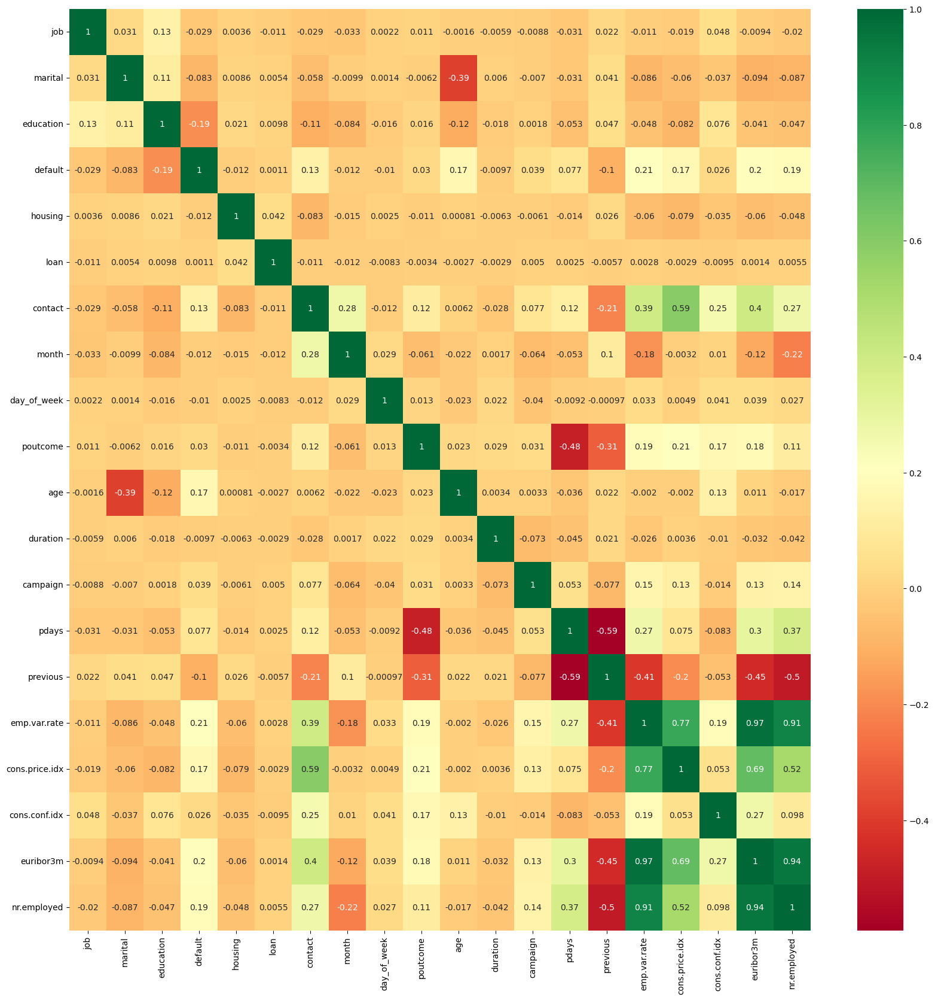

In [37]:
corr_mat = X_enc.corr()
plt.figure(figsize=(20, 20))
sns.heatmap(corr_mat, annot=True, cmap='RdYlGn')

As you can see fields 'euribor3m', 'emp.var.rate', 'nr.employed' strictly correlate each other. It mean that **two of them must be removed from calculation because there are linear depedencies** between them. If we know one of them, we can easy calculate another two. Let's  remove 'emp.var.rate' and 'nr.employed'


In [38]:
col = X_enc.columns
col

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'poutcome', 'age', 'duration', 'campaign',
       'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
       'euribor3m', 'nr.employed'],
      dtype='object')

In [39]:
# Remove two features - 'emp.var.rate' and 'nr.employed'
col_list = list(col)
col_list.remove('emp.var.rate')
col_list.remove('nr.employed')
col_list

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'day_of_week',
 'poutcome',
 'age',
 'duration',
 'campaign',
 'pdays',
 'previous',
 'cons.price.idx',
 'cons.conf.idx',
 'euribor3m']

<details><summary>Click <b>here</b> for the solution</summary> 
<code>    
col_list = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
            'month', 'day_of_week', 'poutcome', 'age', 'duration', 'campaign',
            'pdays', 'previous', 'cons.price.idx', 'cons.conf.idx', 'euribor3m']
    </code>
</details>




In [40]:
X_train_enc = X_enc[col_list]
X_train_enc  # This is the final features selected for training.

,job,marital,education,default,housing,loan,contact,month,day_of_week,poutcome,age,duration,campaign,pdays,previous,cons.price.idx,cons.conf.idx,euribor3m
0,4.00,1.00,6.00,1.00,0.00,2.00,0.00,6.00,2.00,1.00,0.25,0.05,0.00,1.00,0.00,0.27,0.19,0.16
1,4.00,0.00,6.00,1.00,2.00,0.00,0.00,8.00,2.00,1.00,0.46,0.05,0.00,1.00,0.00,0.09,1.00,0.03
2,1.00,1.00,2.00,1.00,0.00,0.00,1.00,6.00,3.00,1.00,0.40,0.19,0.02,1.00,0.00,0.70,0.60,0.96
3,7.00,1.00,6.00,0.00,2.00,0.00,1.00,6.00,4.00,1.00,0.16,0.01,0.04,1.00,0.00,0.70,0.60,0.96
4,1.00,2.00,2.00,0.00,0.00,0.00,1.00,4.00,2.00,1.00,0.07,0.09,0.00,1.00,0.00,0.88,0.38,0.98
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28826,0.00,0.00,6.00,0.00,0.00,0.00,0.00,1.00,4.00,1.00,0.43,0.13,0.02,1.00,0.00,0.48,0.62,0.98
28827,4.00,0.00,6.00,0.00,0.00,0.00,0.00,6.00,0.00,1.00,0.48,0.04,0.00,1.00,0.00,0.27,0.19,0.15
28828,0.00,2.00,5.00,0.00,0.00,0.00,0.00,0.00,2.00,1.00,0.15,0.10,0.04,1.00,0.00,0.34,0.15,0.17
28829,3.00,2.00,5.00,0.00,2.00,2.00,0.00,1.00,1.00,1.00,0.22,0.03,0.00,1.00,0.00,0.48,0.62,0.98


## Classification models


### Test Datasets Transformation


Test dataset should go through the same preprocessing and selection process as the train dataset. To facilitate this, **ColumnTransformer** is useful to simplify the code.

In [41]:
# Column trasnformation
ct = ColumnTransformer([
         ('cat', OrdinalEncoder(), col_cat),
         ('num', MinMaxScaler(feature_range=(0, 1)), col_num)
     ])
X_trf = ct.fit_transform(X_train)
X_trf

array([[4.        , 1.        , 6.        , ..., 0.19246862, 0.15710723,
        0.51228733],
       [4.        , 0.        , 6.        , ..., 1.        , 0.02720472,
        0.20378072],
       [1.        , 1.        , 2.        , ..., 0.60251046, 0.95715257,
        0.85973535],
       ...,
       [0.        , 2.        , 5.        , ..., 0.15481172, 0.16572206,
        0.51228733],
       [3.        , 2.        , 5.        , ..., 0.61506276, 0.98141011,
        1.        ],
       [0.        , 1.        , 3.        , ..., 0.60251046, 0.95783269,
        0.85973535]])

In [42]:
# Compare with what we previously got
X_enc.to_numpy()

array([[4.        , 1.        , 6.        , ..., 0.19246862, 0.15710723,
        0.51228733],
       [4.        , 0.        , 6.        , ..., 1.        , 0.02720472,
        0.20378072],
       [1.        , 1.        , 2.        , ..., 0.60251046, 0.95715257,
        0.85973535],
       ...,
       [0.        , 2.        , 5.        , ..., 0.15481172, 0.16572206,
        0.51228733],
       [3.        , 2.        , 5.        , ..., 0.61506276, 0.98141011,
        1.        ],
       [0.        , 1.        , 3.        , ..., 0.60251046, 0.95783269,
        0.85973535]])

In [43]:
# After column transformation, feature selection is done.
X_train_enc = pd.DataFrame(X_trf, columns=col_cat+col_num)[col_list]
X_train_enc.head(5)

,job,marital,education,default,housing,loan,contact,month,day_of_week,poutcome,age,duration,campaign,pdays,previous,cons.price.idx,cons.conf.idx,euribor3m
0,4.00,1.00,6.00,1.00,0.00,2.00,0.00,6.00,2.00,1.00,0.25,0.05,0.00,1.00,0.00,0.27,0.19,0.16
1,4.00,0.00,6.00,1.00,2.00,0.00,0.00,8.00,2.00,1.00,0.46,0.05,0.00,1.00,0.00,0.09,1.00,0.03
2,1.00,1.00,2.00,1.00,0.00,0.00,1.00,6.00,3.00,1.00,0.40,0.19,0.02,1.00,0.00,0.70,0.60,0.96
3,7.00,1.00,6.00,0.00,2.00,0.00,1.00,6.00,4.00,1.00,0.16,0.01,0.04,1.00,0.00,0.70,0.60,0.96
4,1.00,2.00,2.00,0.00,0.00,0.00,1.00,4.00,2.00,1.00,0.07,0.09,0.00,1.00,0.00,0.88,0.38,0.98


Now, we have to do the same process on test dataset

In [44]:
# X: transformation and features selection
X_test_trf = ct.transform(X_test)
X_test_enc = pd.DataFrame(X_test_trf, columns=col_cat+col_num)[col_list]
X_test_enc.head(5)

,job,marital,education,default,housing,loan,contact,month,day_of_week,poutcome,age,duration,campaign,pdays,previous,cons.price.idx,cons.conf.idx,euribor3m
0,1.00,1.00,2.00,0.00,2.00,0.00,0.00,3.00,0.00,1.00,0.27,0.15,0.04,1.00,0.00,0.67,0.34,0.98
1,1.00,1.00,0.00,0.00,2.00,0.00,0.00,0.00,0.00,1.00,0.47,0.06,0.02,1.00,0.00,0.34,0.15,0.17
2,1.00,1.00,2.00,1.00,0.00,0.00,1.00,4.00,2.00,1.00,0.27,0.05,0.00,1.00,0.00,0.88,0.38,0.98
3,6.00,1.00,2.00,0.00,2.00,0.00,0.00,1.00,2.00,1.00,0.48,0.04,0.11,1.00,0.00,0.48,0.62,0.98
4,1.00,1.00,2.00,0.00,2.00,0.00,0.00,7.00,0.00,1.00,0.40,0.06,0.00,1.00,0.00,0.39,0.37,0.77


In [45]:
# y: label encoding
y_test_enc = le.transform(y_test)
y_test_enc

array([1, 0, 0, ..., 0, 0, 1])

### Extra Trees Classifier


Let's create and fit ExtraTreesClassifier on train DataSet and calculate accuracy of classification:


In [46]:
etc = ExtraTreesClassifier()
etc.fit(X_train_enc, y_train_enc)

ExtraTreesClassifier()

Evaluate the model on test data for obtain predictions


In [47]:
yhat = etc.predict(X_test_enc)
yhat

array([0, 0, 0, ..., 0, 0, 0])

Evaluate accuracy: 


In [48]:
accuracy = accuracy_score(y_test_enc, yhat)
print(f'Accuracy: {accuracy*100:.2f}')

Accuracy: 90.87


### Logistic regression 


As you can see the accuracy of ExtraTreesClassifier is very good.

There are many different techniques for scoring features and selecting features based on scores; how do you know which one to use?

A robust approach is to evaluate models using different feature selection methods (and numbers of features) and select the method that results in a model with the best performance.

**[Logistic regression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html)** is a good model for testing feature selection methods as it can perform better if irrelevant features are removed from the model. We will use this model in a similar way as the previous one.


In [49]:
lr = LogisticRegression()
lr.fit(X_train_enc, y_train_enc)
yhat = lr.predict(X_test_enc)

accuracy = accuracy_score(y_test_enc, yhat)
print(f'Accuracy: {accuracy*100:.2f}')

Accuracy: 91.15


In [50]:
lr = LogisticRegression()
lr.fit(X_train_enc, y_train_enc)
yhat = lr.predict(X_test_enc)

accuracy = accuracy_score(y_test_enc, yhat)
print(f'Accuracy: {accuracy*100:.2f}')

Accuracy: 91.15


<details><summary>Click <b>here</b> for the solution</summary> 
<code>    
model = LogisticRegression(solver='lbfgs')
model.fit(X_train, y_train)
yhat = model.predict(X_test)
accuracy = accuracy_score(y_test, yhat)
print('Accuracy: %.2f' % (accuracy*100))
    </code>
</details>


As you can see accuracy is little better


## Decision tree


### Build model


As shown, the previous methods have high accuracy. However, the biggest drawback is the inability to visualize or justify the decision.


Decision trees are a popular supervised learning method for a variety of reasons. Benefits of decision trees include that they can be used for both regression and classification, they **don’t require feature scaling**, and they are relatively easy to interpret as *you can visualize decision trees*. This is not only a powerful way to understand your model, but also to communicate how your model works.


A **[Decision Tree](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html)** is a supervised algorithm used in machine learning. It is using a binary tree graph (each node has two children) to assign each sample to a target value. The target values are presented in the tree leaves. To reach to the leaf, the sample is propagated through nodes, starting at the root node. In each node, a decision is made and child nodes are generated. A decision is made based on the selected sample’s feature. Decision Tree learning is a process of finding the optimal rules in each internal tree node, according to the selected metric.


This method also calculates **feature importance**.
Let's calculate them. Choose the best 10 of them. Refit the model and visualize decision tree.


In [51]:
dt = DecisionTreeClassifier()
dt.fit(X_train_enc, y_train_enc)
yhat = dt.predict(X_test_enc)

accuracy = accuracy_score(y_test_enc, yhat)
print(f'Accuracy: {accuracy*100:.2f}')

Accuracy: 88.59


<details><summary>Click <b>here</b> for the solution</summary> 
<code>    
model.fit(X_train, y_train)
yhat = model.predict(X_test)
accuracy = accuracy_score(y_test, yhat)
print('Accuracy: %.2f' % (accuracy*100))
    </code>
</details>



In [52]:
print("Features impotance:", dt.feature_importances_)

Features impotance: [0.04403601 0.02044312 0.03956792 0.0084066  0.01797549 0.01190016
 0.00690627 0.01729185 0.03984047 0.00610037 0.0964938  0.35493767
 0.03670479 0.02461422 0.01192609 0.01151587 0.02988198 0.22145733]


Plot graph of feature importances for better visualization. The process is the same as what we did with ExtraTreesClassifier for feature selection.


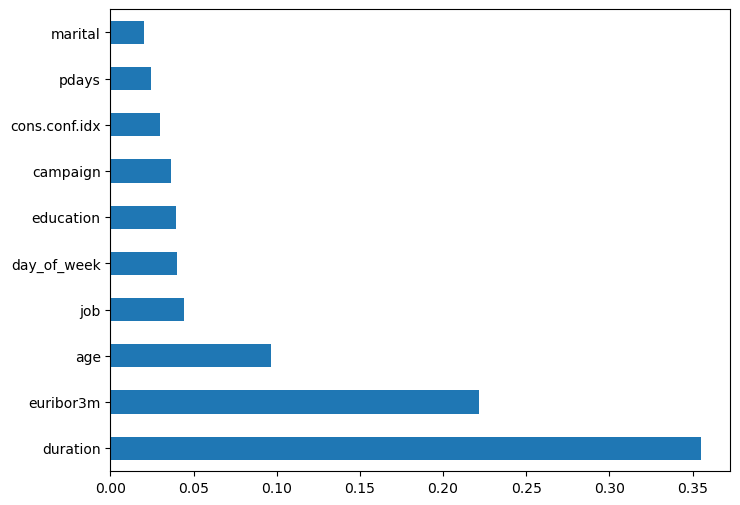

In [53]:
ft_importances = pd.Series(dt.feature_importances_, index=X_train_enc.columns)
ft_importances.nlargest(10).plot(kind='barh')
plt.show()

Create list of the best 10 features for refitting.


In [54]:
col = ft_importances.nlargest(10).index
col

Index(['duration', 'euribor3m', 'age', 'job', 'day_of_week', 'education',
       'campaign', 'cons.conf.idx', 'pdays', 'marital'],
      dtype='object')

(Even though we did feature selection before,) let's refit the model on most important features.


In [55]:
X_train_dt = X_train_enc[col]
X_test_dt = X_test_enc[col]

dt = DecisionTreeClassifier()
dt.fit(X_train_dt, y_train_enc)
yhat = dt.predict(X_test_dt)

accuracy = accuracy_score(y_test_enc, yhat)
print(f'Accuracy: {accuracy*100:.2f}')

Accuracy: 89.01


As you can see accuracy got little better.


### Visualization of decision tree


Let's visualize decision tree.
There are some ways to do it. 


### Text visualization


In [56]:
text_representation = tree.export_text(dt)
print(text_representation)    # type: str

|--- feature_1 <= 0.14
|   |--- feature_0 <= 0.04
|   |   |--- feature_8 <= 0.01
|   |   |   |--- feature_4 <= 1.50
|   |   |   |   |--- feature_0 <= 0.04
|   |   |   |   |   |--- feature_7 <= 0.78
|   |   |   |   |   |   |--- feature_5 <= 6.50
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- feature_5 >  6.50
|   |   |   |   |   |   |   |--- feature_9 <= 1.50
|   |   |   |   |   |   |   |   |--- feature_1 <= 0.05
|   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |--- feature_1 >  0.05
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |--- feature_9 >  1.50
|   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- feature_7 >  0.78
|   |   |   |   |   |   |--- feature_0 <= 0.03
|   |   |   |   |   |   |   |--- feature_7 <= 0.84
|   |   |   |   |   |   |   |   |--- feature_1 <= 0.05
|   |   |   |   |   |   |   |   |   |--- feature_0 <= 0.02
|   |   |   |   |   |   |   |   |   |   |--- class: 0

You can save it as a file.


In [57]:
with open('decision_tree.log', 'w') as file:
    file.write(text_representation)

### Plot tree


You can plot tree using by two different ways.


**[plot_tree](https://scikit-learn.org/stable/modules/generated/sklearn.tree.plot_tree.html)** (slow render - this can take some time): 


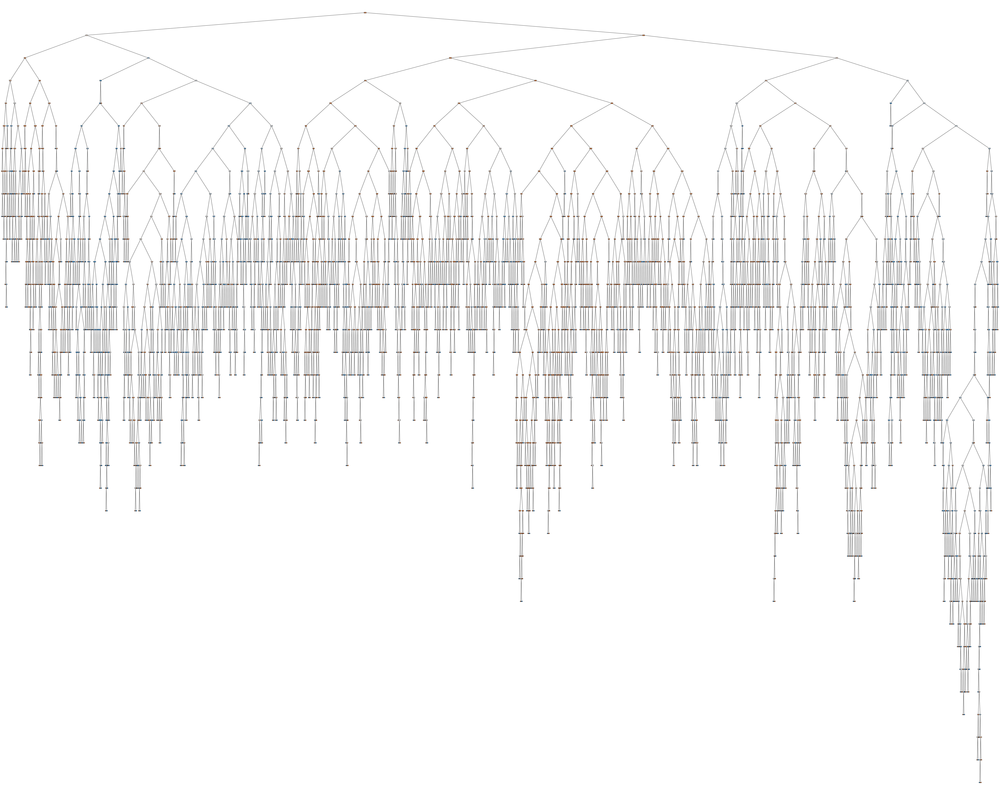

In [58]:
fig = plt.figure(figsize=(100, 80))
_ = tree.plot_tree(dt, feature_names=list(col), class_names=list(le.classes_), filled=True)

In [59]:
fig.savefig('decision_tree.png')

Or you can use **[python-graphviz](https://scikit-learn.org/stable/modules/generated/sklearn.tree.export_graphviz.html)** library. This is more fast function


In [61]:
dot_data = tree.export_graphviz(dt, feature_names=col, class_names=le.classes_, filled=True)    # type: str

After creation you can draw graph


In [62]:
graph = graphviz.Source(dot_data, format='png')
graph

And render it into file:


In [65]:
# Save the source to file and render with the Graphviz engine.
graph.render('decision_tree_graphviz')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.301619 to fit


'decision_tree_graphviz.png'

## Conclusions


In this lab we learned to do preliminary data processing. In particular, change data types, normalize and process categorical data. It was shown how to make feature selection by different methods. Learned how to build training and test datasets and how to work with different classifiers. It has also shown how to visualize a decision tree.

As a result, it has shown how to predict whether the client will subscribe a term deposit or not. The accuracy of decision was about 90%. 


## Write functions


In [66]:
clf = ExtraTreesClassifier()

Create a function that will calculate the accuracy of the defined classification model.


In [68]:
def model_ac(X_train, y_train, X_test, y_test, clf):
    clf.fit(X_train, y_train)
    yhat = clf.predict(X_test)
    accuracy = accuracy_score(y_test, yhat)
    return accuracy

In [76]:
print(f'Accuracy: {model_ac(X_train_enc, y_train_enc, X_test_enc, y_test_enc, clf)*100:.2f}')

Accuracy: 90.98


Create a function that will calculate the features impotance of the defined classification model.


In [85]:
def feature_imp(X_train, y_train, clf):
    clf.fit(X_train, y_train)
    feat_imp = pd.Series(clf.feature_importances_, index=X_train.columns)
    feat_imp = feat_imp.sort_values(ascending=False)
    return feat_imp

In [88]:
feat_imp = feature_imp(X_train_enc, y_train_enc, clf)
print(f'Feature Importance:')
print(feat_imp)

Feature Importance:
duration         0.25
euribor3m        0.12
age              0.09
pdays            0.06
campaign         0.06
job              0.06
education        0.05
day_of_week      0.05
cons.conf.idx    0.04
marital          0.03
cons.price.idx   0.03
poutcome         0.03
month            0.03
housing          0.03
loan             0.02
previous         0.02
contact          0.01
default          0.01
dtype: float64


Write a function that shows the accuracy change of the model depeding on the different sets of input features.


In [97]:
def feature_preformance(features, X_train, y_train, X_test, y_test, clf):
    col = []
    accuracy = []
    # Get the features from hightest feature importances and see the model performance.
    for feat in features:
        col.append(feat)
        acc = model_ac(X_train[col], y_train, X_test[col], y_test, clf)
        accuracy.append(acc)
        print('Input features:', col, 'Accuracy:', round(acc*100, 2))
    
    accuracy = pd.Series(accuracy, index=range(1, 19))
    accuracy.plot()
    plt.xlabel('The number of features')
    plt.ylabel('Accuracy')

Input features: ['duration'] Accuracy: 89.07
Input features: ['duration', 'euribor3m'] Accuracy: 89.73
Input features: ['duration', 'euribor3m', 'age'] Accuracy: 90.25
Input features: ['duration', 'euribor3m', 'age', 'pdays'] Accuracy: 90.69
Input features: ['duration', 'euribor3m', 'age', 'pdays', 'campaign'] Accuracy: 90.67
Input features: ['duration', 'euribor3m', 'age', 'pdays', 'campaign', 'job'] Accuracy: 90.73
Input features: ['duration', 'euribor3m', 'age', 'pdays', 'campaign', 'job', 'education'] Accuracy: 90.81
Input features: ['duration', 'euribor3m', 'age', 'pdays', 'campaign', 'job', 'education', 'day_of_week'] Accuracy: 91.01
Input features: ['duration', 'euribor3m', 'age', 'pdays', 'campaign', 'job', 'education', 'day_of_week', 'cons.conf.idx'] Accuracy: 91.13
Input features: ['duration', 'euribor3m', 'age', 'pdays', 'campaign', 'job', 'education', 'day_of_week', 'cons.conf.idx', 'marital'] Accuracy: 90.98
Input features: ['duration', 'euribor3m', 'age', 'pdays', 'campai

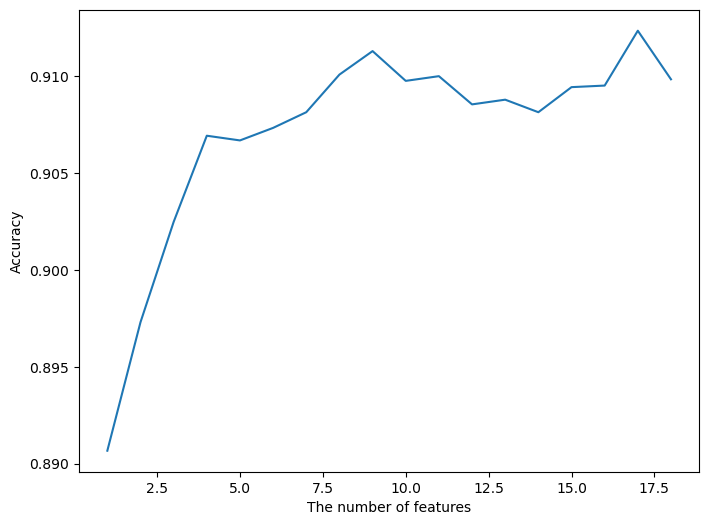

In [98]:
feature_preformance(feat_imp.index, X_train_enc, y_train_enc, X_test_enc, y_test_enc, clf)